<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Extract-genes-highly-expressed-in-T-cells" data-toc-modified-id="Extract-genes-highly-expressed-in-T-cells-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Extract genes highly expressed in T cells</a></span></li><li><span><a href="#Differential-Expression" data-toc-modified-id="Differential-Expression-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Differential Expression</a></span><ul class="toc-item"><li><span><a href="#HSC" data-toc-modified-id="HSC-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>HSC</a></span></li><li><span><a href="#Prog" data-toc-modified-id="Prog-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Prog</a></span></li></ul></li><li><span><a href="#Filtering-genes-according-to-overall-expression-and-expression-on-cell-surface" data-toc-modified-id="Filtering-genes-according-to-overall-expression-and-expression-on-cell-surface-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Filtering genes according to overall expression and expression on cell surface</a></span></li><li><span><a href="#Filtering-genes-according-to-T-cell-expression" data-toc-modified-id="Filtering-genes-according-to-T-cell-expression-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Filtering genes according to T cell expression</a></span></li><li><span><a href="#Filtering-according-to-expression-across-vital-tissues" data-toc-modified-id="Filtering-according-to-expression-across-vital-tissues-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Filtering according to expression across vital tissues</a></span></li><li><span><a href="#UMAP-plot---VanGalen" data-toc-modified-id="UMAP-plot---VanGalen-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>UMAP plot - VanGalen</a></span><ul class="toc-item"><li><span><a href="#Batch-correction" data-toc-modified-id="Batch-correction-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Batch correction</a></span></li></ul></li><li><span><a href="#Expression-of-candidate-targets-per-patient" data-toc-modified-id="Expression-of-candidate-targets-per-patient-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Expression of candidate targets per patient</a></span></li><li><span><a href="#Candidate-target-expression-vs-reference" data-toc-modified-id="Candidate-target-expression-vs-reference-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Candidate target expression vs reference</a></span></li><li><span><a href="#Candidate-target-expression-vs-reference-on-HSPCs" data-toc-modified-id="Candidate-target-expression-vs-reference-on-HSPCs-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Candidate target expression vs reference on HSPCs</a></span></li></ul></div>

The notebook reproduces the main analysis of AML samples from VanGalen et al, 2019 and the main figures from the corresponding paper.

First we import required packages:

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

from gprofiler import gprofiler

import warnings
from rpy2.rinterface import RRuntimeWarning
from rpy2.robjects import pandas2ri

%load_ext rpy2.ipython

warnings.filterwarnings("ignore", category=RRuntimeWarning)
pandas2ri.activate()
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
sc.settings.verbosity = 3
sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                         8.4.0
anyio                       NA
asciitree                   NA
attr                        21.2.0
babel                       2.9.1
backcall                    0.2.0
backports                   NA
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      1.0.9
certifi                     2021.10.08
cffi                        1.15.0
chardet                     4.0.0
charset_normalizer          2.0.8
cloudpickle                 2.0.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
dask                        2021.11.2
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.0
defusedxml                  0.7.1
entrypoints                 0.3
fasteners                   NA
fsspec                      2022.7.1
google                      NA
gprofiler                   1.0.0
h5py       

In [2]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
sc.set_figure_params(vector_friendly=True, color_map='Reds',
                     dpi=200,transparent=True, fontsize=14)

In [ ]:
# set path for data and results
writepath='path/to/data/'

# Extract genes highly expressed in T cells

First, we use the processed VanGalen data to extract highly expressed genes in T cells as a filtering step for later

In [5]:
adata=sc.read(writepath + 'AML_processed.h5ad')

In [ ]:
# subset to only T cells
ix=np.isin(adata.obs['PredictionRefined'],['malignant', 'normal']) 
adata_sub=adata[ix].copy()
ix=np.isin(adata_sub.obs['CellType'],['T', 'CTL']) 
adata_sub_T=adata_sub[ix].copy()

In [8]:
# merge CTF and T clusters

In [9]:
adata_sub.obs['CellType_merged']=adata_sub.obs['CellType'].copy()
ref_cluster=pd.Categorical(adata_sub.obs['CellType_merged'],
                           categories=['HSC-like', 'Prog-like', 'Mono-like', 'ProMono-like', 'GMP-like',
       'cDC-like', 'HSC', 'Prog', 'Mono', 'ProMono', 'GMP', 'cDC', 'earlyEry',
       'lateEry', 'ProB', 'B', 'T', 'CTL', 'NK', 'Plasma', 'pDC'])

In [10]:
ix=np.isin(ref_cluster,['CTL'])
ref_cluster[ix]='T'

In [11]:
adata_sub.obs['CellType_merged']=pd.Categorical(ref_cluster,
                                            categories=['HSC-like', 'Prog-like', 'Mono-like', 'ProMono-like', 'GMP-like',
       'cDC-like', 'HSC', 'Prog', 'Mono', 'ProMono', 'GMP', 'cDC', 'earlyEry',
       'lateEry', 'ProB', 'B', 'T', 'NK', 'Plasma', 'pDC'])

In [12]:
adata_sub.rename_categories('CellType_merged', ['HSC-like', 'Prog-like', 'Mono-like', 'ProMono-like', 'GMP-like',
       'cDC-like', 'HSC', 'Prog', 'Mono', 'ProMono', 'GMP', 'cDC', 'earlyEry',
       'lateEry', 'ProB', 'B', 'T', 'NK', 'Plasma', 'pDC'])

/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


In [13]:
# subset to only healthy cells
ix=np.isin(adata_sub.obs['PredictionRefined'],['normal']) 
adata_sub_healthy=adata_sub[ix].copy()

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [14]:
# perform differential expression analysis
sc.tl.rank_genes_groups(adata_sub_healthy, groupby='CellType_merged', groups=['T'],
                        n_genes=len(adata_sub.var), key_added='healthyT_v_sallhealthy')

ranking genes
    finished: added to `.uns['healthyT_v_sallhealthy']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


In [15]:
df_T=pd.DataFrame(adata_sub_healthy.uns['healthyT_v_sallhealthy']['names'])

tmp=np.array(pd.DataFrame(adata_sub_healthy.uns['healthyT_v_sallhealthy']['pvals']))
df_T['T_pval']=tmp

tmp=np.array(pd.DataFrame(adata_sub_healthy.uns['healthyT_v_sallhealthy']['logfoldchanges']))
df_T['T_logfoldchanges']=tmp

In [53]:
# save gene list
df_T.to_csv(writepath + 'healthy_T_genes.csv')

# Differential Expression

## HSC

In [314]:
adata=sc.read(writepath + 'AML_processed.h5ad')

/home/moritz.thomas/.local/lib/python3.8/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/moritz.thomas/.local/lib/python3.8/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [315]:
# remove unclear cells
ix=np.isin(adata.obs['PredictionRefined'],['malignant', 'normal']) 
adata=adata[ix].copy()

In [316]:
adata.obs.PredictionRefined.cat.categories

Index(['malignant', 'normal'], dtype='object')

In [317]:
adata

AnnData object with n_obs × n_vars = 28404 × 17434
    obs: 'AlignedToGenome', 'AlignedToTranscriptome', 'CellType', 'CyclingBinary', 'CyclingScore', 'MutTranscripts', 'NanoporeTranscripts', 'NumberOfGenes', 'NumberOfReads', 'PredictionRF2', 'PredictionRefined', 'Score_B', 'Score_CTL', 'Score_GMP', 'Score_HSC', 'Score_Mono', 'Score_NK', 'Score_Plasma', 'Score_ProB', 'Score_ProMono', 'Score_Prog', 'Score_T', 'Score_cDC', 'Score_earlyEry', 'Score_lateEry', 'Score_pDC', 'TranscriptomeUMIs', 'WtTranscripts', 'day', 'patient', 'sample', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'diffmap_evals', 'draw_graph', 'neighbors', 'patient_colors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [318]:
# subset to only HSCs
ix=np.isin(adata.obs['CellType'],['HSC', 'HSC-like']) 
adata_HSC=adata[ix].copy()

In [319]:
sc.pp.calculate_qc_metrics(adata_HSC, inplace=True)

In [320]:
# filter out poorly expressed genes for differential expression analysis
sc.pp.filter_genes(adata_HSC, min_cells=5)

filtered out 2922 genes that are detected in less than 5 cells


In [322]:
# filter out genes that are expressed in more than 2000 counts for differential expression analysis
sc.pp.filter_genes(adata_HSC, max_cells=2000)

In [356]:
# perform differential expression analysis
sc.tl.rank_genes_groups(adata_HSC, groupby='PredictionRefined',
                        n_genes=len(adata_HSC.var), key_added='testing')

ranking genes
    finished: added to `.uns['testing']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [357]:
df_HSC=pd.DataFrame(adata_HSC.uns['testing']['names'])

tmp=np.array(pd.DataFrame(adata_HSC.uns['testing']['pvals'])['malignant'])
df_HSC['malignant_pval']=tmp

tmp=np.array(pd.DataFrame(adata_HSC.uns['testing']['pvals'])['normal'])
df_HSC['normal_pval']=tmp

tmp=np.array(pd.DataFrame(adata_HSC.uns['testing']['logfoldchanges'])['malignant'])
df_HSC['malignant_logfoldchanges']=tmp

tmp=np.array(pd.DataFrame(adata_HSC.uns['testing']['logfoldchanges'])['normal'])
df_HSC['normal_logfoldchanges']=tmp

In [ ]:
# filter out genes that have a malignant_pval under 0.01
df_HSC_filtered=df_HSC[df_HSC['malignant_pval'] <= 0.01]
# filter out genes that have a malignant_logfoldchanges over 2
df_HSC_filtered=df_HSC_filtered[df_HSC_filtered['malignant_logfoldchanges'] > 2]

In [34]:
df_HSC_filtered.to_csv(writepath + 'HSC_genes.csv')

## Prog

In [35]:
# subset to HPCs
ix=np.isin(adata.obs['CellType'],['Prog', 'Prog-like']) 
adata_Prog=adata[ix].copy()

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [36]:
adata_Prog

AnnData object with n_obs × n_vars = 3606 × 17434 
    obs: 'AlignedToGenome', 'AlignedToTranscriptome', 'CellType', 'CyclingBinary', 'CyclingScore', 'MutTranscripts', 'NanoporeTranscripts', 'NumberOfGenes', 'NumberOfReads', 'PredictionRF2', 'PredictionRefined', 'Score_B', 'Score_CTL', 'Score_GMP', 'Score_HSC', 'Score_Mono', 'Score_NK', 'Score_Plasma', 'Score_ProB', 'Score_ProMono', 'Score_Prog', 'Score_T', 'Score_cDC', 'Score_earlyEry', 'Score_lateEry', 'Score_pDC', 'TranscriptomeUMIs', 'WtTranscripts', 'day', 'patient', 'sample', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [37]:
sc.pp.calculate_qc_metrics(adata_Prog, inplace=True)

In [38]:
# filter out poorly expressed genes for differential expression analysis
sc.pp.filter_genes(adata_Prog, min_cells=5)

filtered out 1500 genes that are detected in less than 5 cells


In [39]:
# filter out genes that are expressed in more than 2000 counts for differential expression analysis
sc.pp.filter_genes(adata_Prog, max_cells=3500)

filtered out 60 genes that are detected in more than 3500 cells


In [40]:
# perform differential expression analysis
sc.tl.rank_genes_groups(adata_Prog, groupby='PredictionRefined', n_genes=len(adata_Prog.var), key_added='testing')

ranking genes
    finished: added to `.uns['testing']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [41]:
df_HPC=pd.DataFrame(adata_Prog.uns['testing']['names'])

tmp=np.array(pd.DataFrame(adata_Prog.uns['testing']['pvals'])['malignant'])
df_HPC['malignant_pval']=tmp

tmp=np.array(pd.DataFrame(adata_Prog.uns['testing']['pvals'])['normal'])
df_HPC['normal_pval']=tmp

tmp=np.array(pd.DataFrame(adata_Prog.uns['testing']['logfoldchanges'])['malignant'])
df_HPC['malignant_logfoldchanges']=tmp

tmp=np.array(pd.DataFrame(adata_Prog.uns['testing']['logfoldchanges'])['normal'])
df_HPC['normal_logfoldchanges']=tmp

In [ ]:
# filter out genes that have a malignant_pval under 0.01
df_HPC_filtered=df_HPC[df_HPC['malignant_pval'] <= 0.01]
# filter out genes that have a malignant_logfoldchanges over 2
df_HPC_filtered=df_HPC_filtered[df_HPC_filtered['malignant_logfoldchanges'] > 2]


In [43]:
df_HPC_filtered.to_csv(writepath + 'HPC_genes.csv')

# Filtering genes according to overall expression and expression on cell surface

In [148]:
#read in surface genes (see other notebook)
surface=pd.read_csv(writepath + 'CellPhoneDB_CSPA_Surfaceome_HPA.csv')
surface=np.array(surface['CellPhoneDB_CSPA_Surfaceome_HPA'])
len(surface)

4924

In [149]:
#read in druggable genes
druggable=pd.read_csv(writepath + 'druggable_proteome_genes.csv')
druggable=np.array(druggable['druggable_proteome_genes'])
len(druggable)

754

In [ ]:
HSC_genes=pd.read_csv(writepath + 'HSC_genes.csv')
HSC_genes=np.array(HSC_genes['malignant'])

HPC_genes=pd.read_csv(writepath + 'HPC_genes.csv')
HPC_genes=np.array(HPC_genes['malignant'])

In [152]:
sc.pp.calculate_qc_metrics(adata, inplace=True)

In [153]:
# how many of these HSC and HPC genes are expressed in less over 2% of cells

df_candidates=pd.DataFrame(adata[:,HSC_genes].copy().var)
df2=pd.DataFrame()
df2['n_cells']=df_candidates['n_cells_by_counts'].copy()
df2['n_cells_percent']=df2['n_cells']*100/len(adata.obs.index)
HSC_genes=df2[df2['n_cells_percent']>2].index
print(len(HSC_genes))

# how many of these 1055 HSC and 2199 HPC genes are expressed in less over 2% of cells

df_candidates=pd.DataFrame(adata[:,HPC_genes].copy().var)
df2=pd.DataFrame()
df2['n_cells']=df_candidates['n_cells_by_counts'].copy()
df2['n_cells_percent']=df2['n_cells']*100/len(adata.obs.index)
HPC_genes=df2[df2['n_cells_percent']>2].index
print(len(HPC_genes))

# intersection HSPC
HSPC_genes=reduce(np.intersect1d, (HSC_genes, HPC_genes))
len(HSPC_genes)

330
387


96

In [154]:
#intersection surface
step1=reduce(np.intersect1d, (HSPC_genes, surface))
len(step1)

36

# Filtering genes according to T cell expression

In [164]:
tgenes=pd.read_csv(writepath + 'healthy_T_genes.csv')
tgenes=np.array(tgenes['T'])

In [165]:
len(tgenes)

1006

In [2]:
# which candidate genes are highly expressed in t cells?
excluded=step1[np.isin(step1, tgenes, invert=False)]
excluded

['AQP3', 'CD52', 'CEACAM21', 'CRIP1', 'HLA-A', 'IL2RA', 'TNFRSF4']

In [3]:
step2=step1[np.isin(step1, tgenes, invert=True)]
len(step2)

29

# Filtering according to expression across vital tissues

In [644]:
# -> see corresponding CrossOrganAtlas notebooks for this step
# 12 remaining candidates

# -> after interesction with druggable genes
# 2 remaining final candidates: CSF1R, CD86

# UMAP plot - VanGalen

In [58]:
adata=sc.read(writepath + 'AML_processed.h5ad')

/home/moritz.thomas/.local/lib/python3.8/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/moritz.thomas/.local/lib/python3.8/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [59]:
ix=np.isin(adata.obs['PredictionRefined'],['normal','malignant']) 
adata_sub=adata[ix].copy()

In [60]:
adata_sub.uns['PredictionRefined_colors']=['#FC766AFF', '#5B84B1FF']

## Batch correction

In [80]:
#pip install harmonypy

In [81]:
sc.external.pp.harmony_integrate(adata_sub, key='patient', 
                                 basis='X_pca', adjusted_basis='X_pca_harmony')

Note: detected 96 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
Note: NumExpr detected 96 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.
2022-08-16 10:25:26,215 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2022-08-16 10:25:41,983 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2022-08-16 10:25:57,407 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2022-08-16 10:26:12,908 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2022-08-16 10:26:28,418 - harmonypy - INFO - Iteration 5 of 10
Iteration 5 of 10
2022-08-16 10:26:37,207 - harmonypy - INFO - Converged after 5 iterations
Converged after 5 iterations


In [122]:
# umap
sc.pp.neighbors(adata_sub, n_pcs=50, n_neighbors=15, use_rep = "X_pca_harmony")
sc.tl.umap(adata_sub)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [123]:
# more subtle coloring

In [124]:
# reorder categories for UMAP
adata_sub.obs['CellType'].cat.reorder_categories(['T','CTL','NK','HSC','Prog','GMP','ProMono','earlyEry','ProB',
                                                  'Mono','B','cDC','pDC','lateEry', 'Plasma',
                                                  'HSC-like','Prog-like','GMP-like','ProMono-like','Mono-like','cDC-like'],inplace=True)

In [125]:
adata_sub.obs['CellType'].cat.categories

Index(['T', 'CTL', 'NK', 'HSC', 'Prog', 'GMP', 'ProMono', 'earlyEry', 'ProB',
       'Mono', 'B', 'cDC', 'pDC', 'lateEry', 'Plasma', 'HSC-like', 'Prog-like',
       'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like'],
      dtype='object')

In [126]:
adata_sub.uns['CellType_colors']=['#456c35', '#778f51', '#acc38b', 
                                  '#494b64', '#2f1c94','#036fa0', '#80a3db', '#bfb5f5', '#e3e0f3',
                                  '#b58824', '#f9ae17', '#ffd16c', '#cfc94e', '#fffa90', '#fdffcc', 
                                  '#751a2c', '#b31e3c','#b33a3a', '#ab3a18', '#f2744e', '#ed896f']

In [127]:
# healthy T-related ('T', 'CTL', 'NK') -> 3 x green
# healthy early ('HSC', 'Prog', 'GMP', 'ProMono','earlyEry','ProB') -> 6 x soft blue
# healthy late ('Mono',  'B','cDC', 'pDC',  'lateEry', 'Plasma') -> 6 x soft yellow
# 6 malignant ('HSC-like', 'Prog-like','GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like') -> 6 x soft red

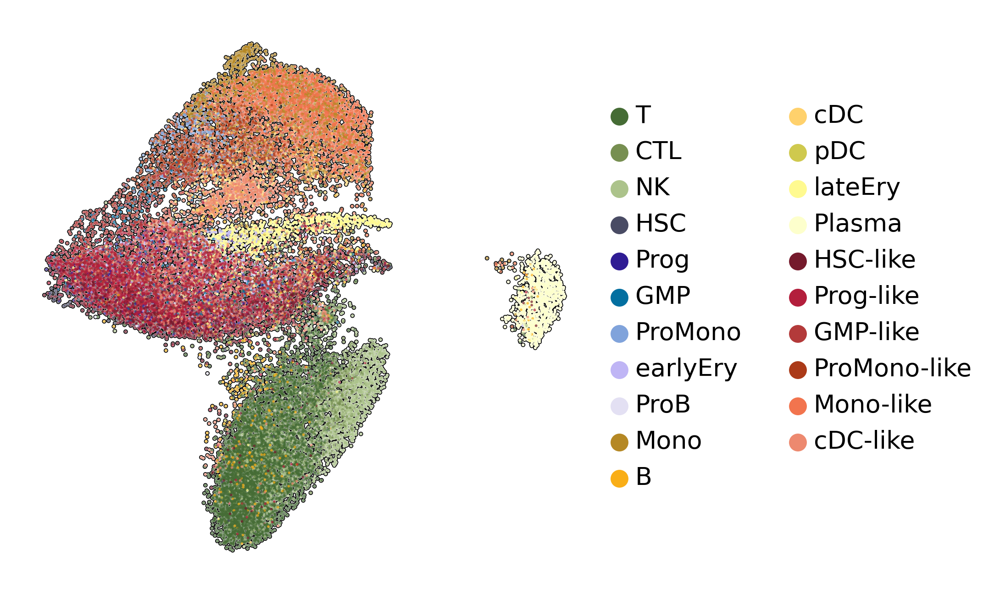

In [128]:
sc.pl.umap(adata_sub, color=['CellType'], add_outline=True, use_raw=False, 
           wspace=0.5, legend_fontsize='x-small', title='',frameon=False)

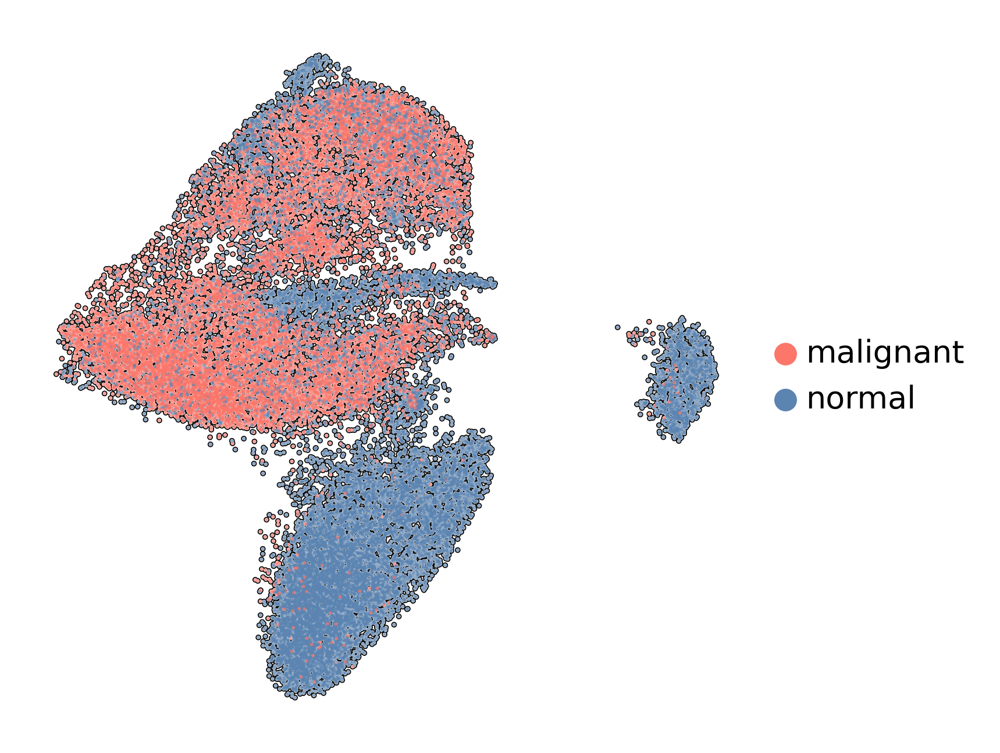

In [130]:
sc.pl.umap(adata_sub, color=['PredictionRefined'], add_outline=True, use_raw=False, 
           wspace=0.5, legend_fontsize='x-small', title='',frameon=False)

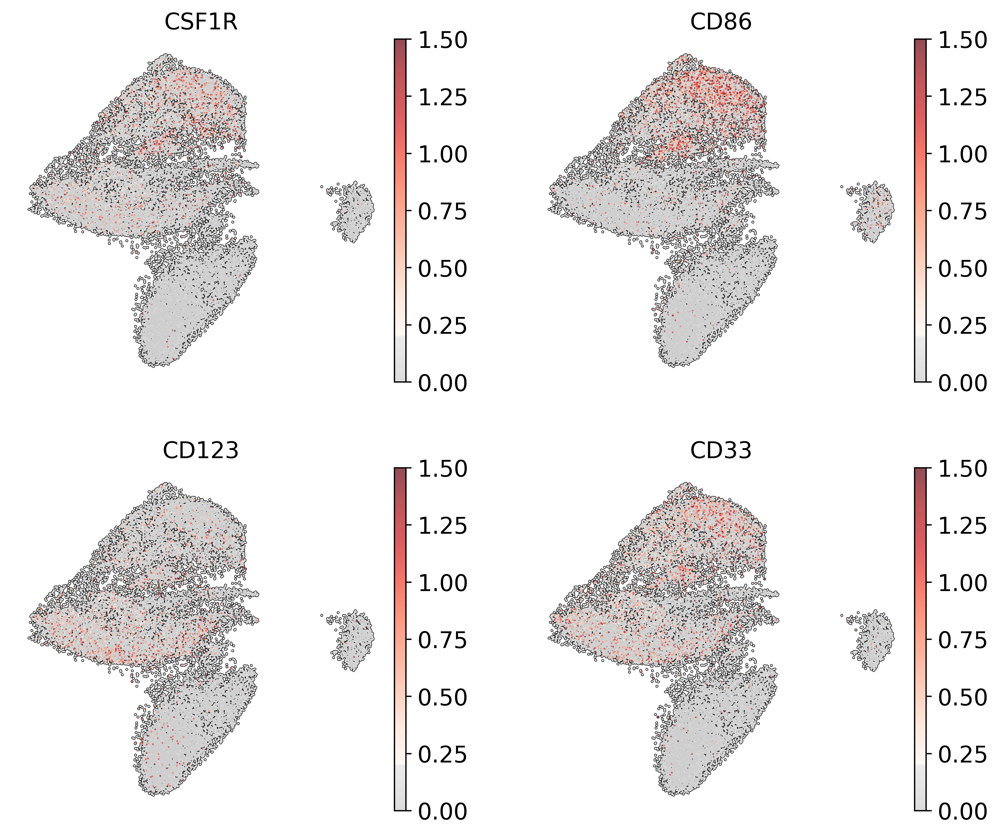

In [363]:
goi=['CSF1R','CD86','IL3RA','CD33']
sc.pl.umap(adata_sub, color=goi, 
           add_outline=True, use_raw=False,wspace=0.25, ncols=2, vmax=1.5, 
           title=['CSF1R','CD86','CD123','CD33'],
           legend_fontsize='x-small',frameon=False, color_map=mymap)

In [131]:
ix=np.isin(adata_sub.obs['CellType'],['T','CTL','NKT']) 
adata_tcell=adata_sub[ix].copy()

In [133]:
# Re-calculate the visualizations
sc.pp.neighbors(adata_tcell, n_pcs=50, n_neighbors=15, use_rep = "X_pca_harmony")
sc.tl.umap(adata_tcell)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


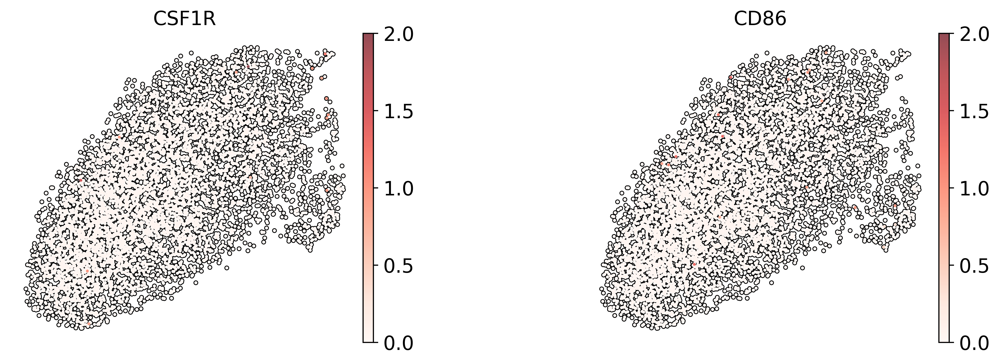

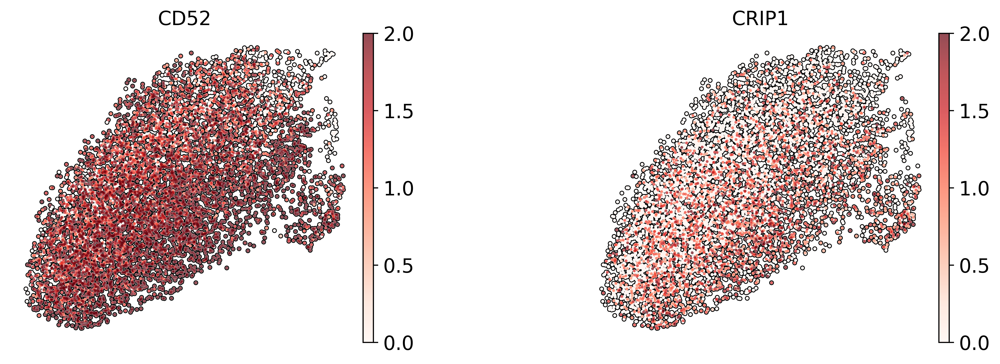

In [136]:
# excluded due to T cell expression
sc.pl.umap(adata_tcell, color=['CSF1R', 'CD86'], add_outline=True, use_raw=False, vmax=2,
           wspace=0.5, legend_fontsize='x-large',frameon=False)

# excluded due to T cell expression
sc.pl.umap(adata_tcell, color=['CD52', 'CRIP1'], add_outline=True, use_raw=False, vmax=2,
           wspace=0.5, legend_fontsize='x-large',frameon=False)

# Expression of candidate targets per patient

In [663]:
goi=['CSF1R', 'CD86']

In [664]:
adata_sub.obs.patient.cat.categories

Index(['AML210A', 'AML314', 'AML328', 'AML329', 'AML371', 'AML419A', 'AML420B',
       'AML475', 'AML556', 'AML707B', 'AML722B', 'AML870', 'AML921A', 'AML997',
       'AML1012'],
      dtype='object')

In [667]:
# malignant vs healthy per patient as barplot

In [668]:
df_fin=pd.DataFrame()

for patient in adata_sub.obs.patient.cat.categories:
    # subset adata
    ix=np.isin(adata_sub.obs['patient'],[patient])
    adata_tmp=adata_sub[ix].copy()

    if len(adata_tmp.obs['PredictionRefined'].cat.categories)==2:
        # get mal and nor values
        mal=np.round(adata_tmp.obs['PredictionRefined'].value_counts()[['malignant','normal']][0]*100/len(adata_tmp.obs.index),2)
        nor=np.round(adata_tmp.obs['PredictionRefined'].value_counts()[['malignant','normal']][1]*100/len(adata_tmp.obs.index),2)
        
        # append to df 
        new_row = {'patient':str(patient), 'malignant':mal, 'normal':nor}
        df_fin = df_fin.append(new_row, ignore_index=True)
    
    else:
        # get only nor value
        nor=np.round(adata_tmp.obs['PredictionRefined'].value_counts()[0]*100/len(adata_tmp.obs.index),2)
        new_row = {'patient':str(patient), 'malignant':0, 'normal':nor}
        df_fin = df_fin.append(new_row, ignore_index=True)

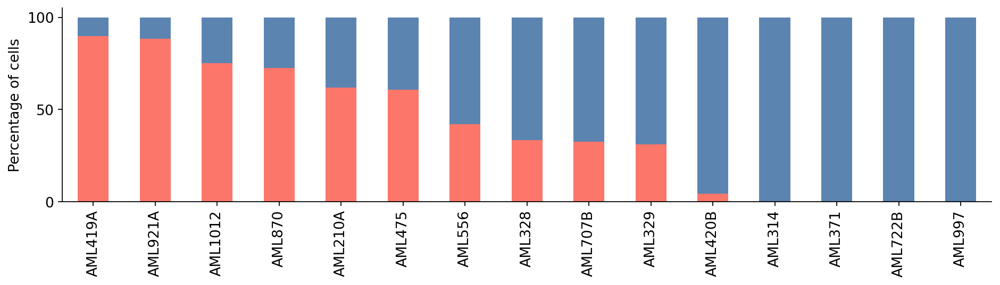

In [670]:
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(14,3))
ax=df_fin.plot(x='patient',
            kind='bar',
            width=0.5, 
               ax=ax,
            stacked=True,
            color=adata_tmp.uns['PredictionRefined_colors'],
            title='')
plt.ylabel('Percentage of cells', size = 12)
plt.xlabel('', size = 12)
plt.xticks(size = 12)
plt.yticks(size = 12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid()
ax.yaxis.grid()
ax.get_legend().remove()
#plt.tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)

In [671]:
df_final=pd.DataFrame()

In [672]:
goi='CSF1R','CD86','IL3RA','CD33'

In [673]:
for patient in adata_sub.obs.patient.cat.categories:
    # subset adata to patient
    ix=np.isin(adata_sub.obs['patient'],[patient])
    adata_tmp=adata_sub[ix].copy()
    
    for gene in goi:
        # subset adata to gene
        adata_tmp_goi=adata_tmp[:,gene].copy()
        
        # calculate how many cells express that gene
        expr=pd.DataFrame(adata_tmp_goi.X)
        expr.index=adata_tmp_goi.obs.index
        expr['PredictionRefined']=adata_tmp_goi.obs['PredictionRefined']
        expr = expr[(expr[0] > 0)]
        expr=expr.groupby('PredictionRefined').count()
        expr=expr.transpose()
        
        # calculate absoulte numbers for percentage
        absolute=pd.DataFrame(adata_tmp_goi.obs['PredictionRefined'].value_counts()).transpose()
        
        # check if that patient has only healthy cells
        
        if len(absolute.columns)==2:
            # if he has both -> add both to df
            goi_mal_pct=int(expr['malignant'])*100/int(absolute['malignant'])
            goi_nor_pct=int(expr['normal'])*100/int(absolute['normal'])
            
            new_row = {'patient':str(patient), 
                       'malignant':goi_mal_pct, 'normal':goi_nor_pct,'gene':str(gene)}
            df_final = df_final.append(new_row, ignore_index=True)
        
        else:
            # if he has only healthy -> add only that
            goi_nor_pct=int(expr['normal'])*100/int(absolute['normal'])
            new_row = {'patient':str(patient), 
                       'normal':goi_nor_pct, 
                       'gene':str(gene)}
            df_final = df_final.append(new_row, ignore_index=True)

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [674]:
df1=df_final[df_final['gene']=='CSF1R']
df2=df_final[df_final['gene']=='CD86']
df3=df_final[df_final['gene']=='IL3RA']
df4=df_final[df_final['gene']=='CD33']

In [675]:
df1.index=df1.patient
df1=df1.loc[df_fin['patient']]

In [676]:
df2.index=df2.patient
df2=df2.loc[df_fin['patient']]

In [677]:
df3.index=df3.patient
df3=df3.loc[df_fin['patient']]

In [678]:
df4.index=df4.patient
df4=df4.loc[df_fin['patient']]

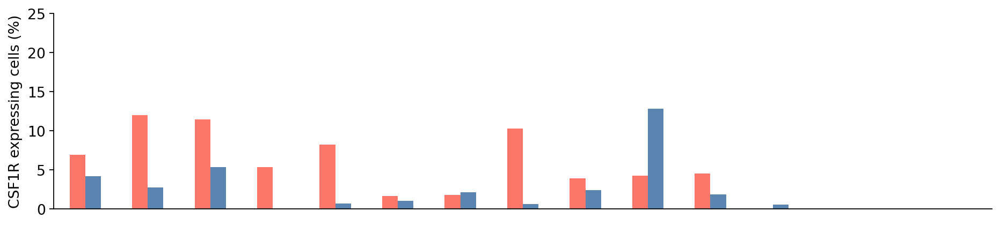

In [679]:
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(14,3))
ax=df1.plot(x='patient',
            kind='bar',
            width=0.5, 
               ax=ax,
            stacked=False,
            color=adata_tmp.uns['PredictionRefined_colors'],
            title='')
plt.ylabel('CSF1R expressing cells (%)', size = 12)
plt.xlabel('', size = 12)
plt.xticks(size = 12)
plt.yticks(size = 12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid()
ax.yaxis.grid()

ax.set_ylim([0, 25])
plt.yticks([0,5,10,15,20,25])

ax.get_legend().remove()
plt.tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)

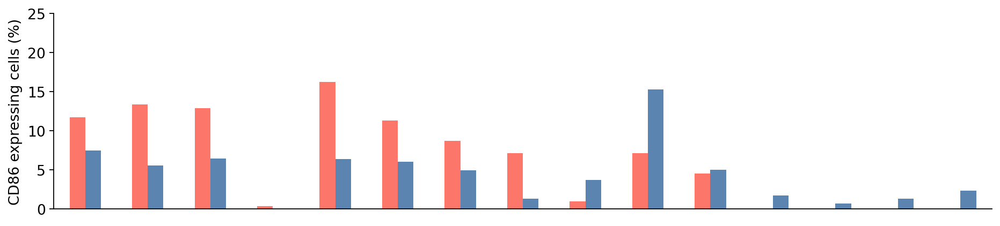

In [680]:
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(14,3))
ax=df2.plot(x='patient',
            kind='bar',
            width=0.5, 
               ax=ax,
            stacked=False,
            color=adata_tmp.uns['PredictionRefined_colors'],
            title='')
plt.ylabel('CD86 expressing cells (%)', size = 12)
plt.xlabel('', size = 12)
plt.xticks(size = 12)
plt.yticks(size = 12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid()
ax.yaxis.grid()

ax.set_ylim([0, 25])
plt.yticks([0,5,10,15,20,25])

ax.get_legend().remove()
plt.tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)

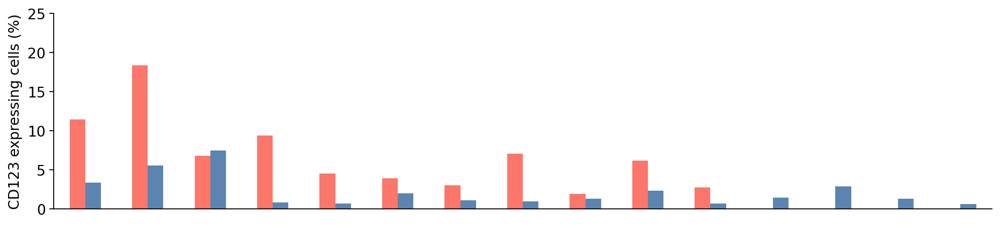

In [681]:
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(14,3))
ax=df3.plot(x='patient',
            kind='bar',
            width=0.5, 
               ax=ax,
            stacked=False,
            color=adata_tmp.uns['PredictionRefined_colors'],
            title='')
plt.ylabel('CD123 expressing cells (%)', size = 12)
plt.xlabel('', size = 12)
plt.xticks(size = 12)
plt.yticks(size = 12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid()
ax.yaxis.grid()

ax.set_ylim([0, 25])
plt.yticks([0,5,10,15,20,25])

ax.get_legend().remove()
plt.tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)

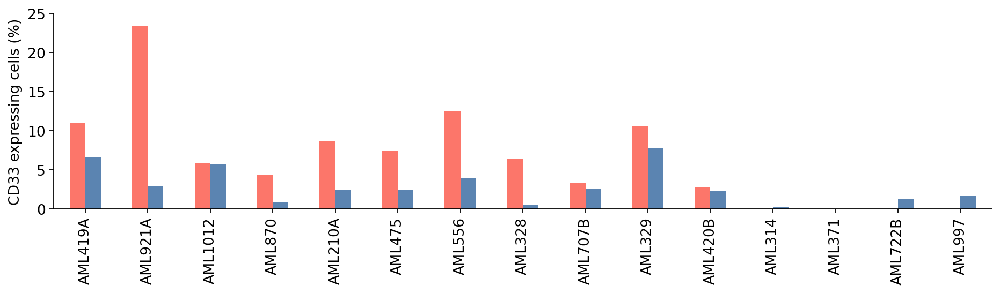

In [682]:
plt.rcParams.update({'font.size': 12})
fig, ax = plt.subplots(figsize=(14,3))
ax=df4.plot(x='patient',
            kind='bar',
            width=0.5, 
               ax=ax,
            stacked=False,
            color=adata_tmp.uns['PredictionRefined_colors'],
            title='')
plt.ylabel('CD33 expressing cells (%)', size = 12)
plt.xlabel('', size = 12)
plt.xticks(size = 12)
plt.yticks(size = 12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid()
ax.yaxis.grid()

ax.set_ylim([0, 25])
plt.yticks([0,5,10,15,20,25])

ax.get_legend().remove()
#plt.tick_params(axis='x',which='both',bottom=False,top=False, labelbottom=False)

# Candidate target expression vs reference

In [710]:
adata_fig=adata_sub[:,['CSF1R', 'CD86','IL3RA','CD33']].copy()

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [711]:
# rename gene IL3RA to CD123 for this figure
adata_fig.var.index=['CSF1R', 'CD86', 'CD123', 'CD33']
adata_fig.var['genesym']=adata_fig.var.index
adata_fig.raw.var['genesym']=adata_fig.raw.var_names
adata_fig.raw.var['genesym']=adata_fig.raw.var['genesym'].replace({'IL3RA': 'CD123'})
adata_fig.var['genesym']=['CSF1R', 'CD86', 'CD123', 'CD33']
adata_fig.raw.var.index=adata_fig.raw.var['genesym'].replace({'IL3RA': 'CD123'})

In [712]:
order=['HSC-like','Prog-like','Mono-like','ProMono-like','GMP-like', 'cDC-like','HSC', 'Prog', 'Mono', 'ProMono', 'GMP', 'cDC',  'earlyEry', 'lateEry', 'ProB', 'B', 'T', 'CTL', 'NK', 'Plasma','pDC']
adata_fig.obs['CellType'] = adata_fig.obs['CellType'].cat.reorder_categories(list(order), ordered=True)


/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1154: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/python/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:2934: FutureWarning: In a future version of pandas all arguments of DataFrame.set_index except for the argument 'keys' will be keyword-only
  obs_tidy.set_index(categorical, groupby, inplace=True)


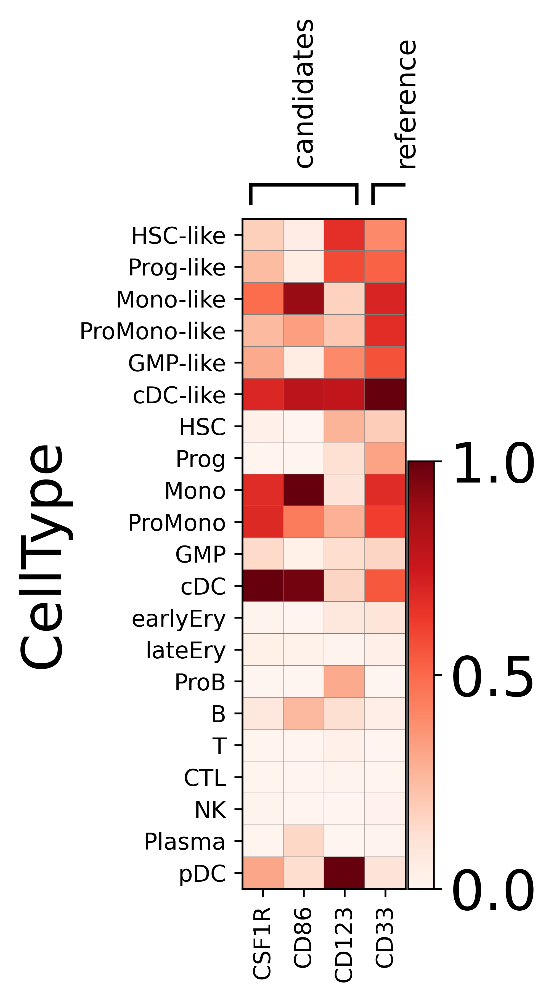

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[1.28, 0, 0.2])

In [713]:
sc.pl.matrixplot(adata_fig, 
                 var_names=['CSF1R', 'CD86', 'CD123', 'CD33'],
                 gene_symbols='genesym',
                 groupby='CellType', 
                 cmap='Reds',
                 var_group_positions=[(0,2),(3,4)],
                 var_group_labels=['candidates','reference'],
                 standard_scale='var')

# Candidate target expression vs reference on HSPCs

In [714]:
adata_sub.obs['CellType'].cat.reorder_categories(['HSC','Prog','GMP','ProMono','Mono','ProB','B',
                                                  'T','CTL','NK','cDC','pDC','earlyEry','lateEry', 'Plasma',
                                                  'HSC-like','Prog-like','GMP-like','ProMono-like',
                                                  'Mono-like','cDC-like'],inplace=True)

/opt/python/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  after removing the cwd from sys.path.


In [715]:
palette=['#008941','#5A0007','#FF34FF','#8FB0FF','#A30059','#B79762','#FFFF00','#FEFFE6','#1CE6FF','#0000A6',
        '#1B4400','#FF2F80','#3B5DFF','#4A3B53','#63FFAC','#006FA6','#809693','#FF4A46','#997D87','#FFDBE5','#4FC601']

In [716]:
adata_sub.uns['CellType_colors']=palette

In [717]:
ix=np.isin(adata_sub.obs['CellType'],['HSC-like','Prog-like','HSC','Prog']) 
adata_sub_fig=adata_sub[ix].copy()

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [718]:
# Calculate the visualizations
sc.pp.neighbors(adata_sub_fig)
sc.tl.umap(adata_sub_fig)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [719]:
adata_sub_fig.obs['CellType'].value_counts()

Prog-like    3288
HSC-like     1592
Prog          318
HSC           287
Name: CellType, dtype: int64

In [720]:
#subsample 300 malignant HSCs for visualization purposes
x_samp=adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['HSC-like'])]
x_samp=np.random.choice(x_samp,300,replace=False)
x_obs=list(x_samp)+list(adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['Prog-like','HSC','Prog'])])
adata_sub_fig=adata_sub_fig[x_obs].copy()

#subsample 300 malignant Progs for visualization purposes
x_samp=adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['Prog-like'])]
x_samp=np.random.choice(x_samp,300,replace=False)
x_obs=list(x_samp)+list(adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['HSC-like','HSC','Prog'])])
adata_sub_fig=adata_sub_fig[x_obs].copy()

/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [721]:
adata_sub_fig.obs['CellType'].value_counts()

Prog         318
HSC-like     300
Prog-like    300
HSC          287
Name: CellType, dtype: int64

In [722]:
adata_sub_fig.uns['CellType_colors']=palette
adata_sub_fig.uns['PredictionRefined_colors']=['#FC766AFF', '#5B84B1FF']

In [723]:
adata_sub_fig.obs['CellType'].cat.reorder_categories(['HSC-like','Prog-like','HSC','Prog'], inplace=True)

/opt/python/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  """Entry point for launching an IPython kernel.


In [726]:
# new colors

In [727]:
adata_sub_fig.obs['CellType'].cat.reorder_categories(['HSC-like','Prog-like','HSC','Prog'], inplace=True)
adata_sub_fig.uns['CellType_colors']=['#751a2c', '#b31e3c','#494b64', '#2f1c94']

/opt/python/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  """Entry point for launching an IPython kernel.


/opt/python/lib/python3.7/site-packages/anndata/_core/anndata.py:1056: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/ruben.brabenec/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/python/lib/python3.7/site-packages/ipykernel_launcher.py:16: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  app.launch_new_instance()
/opt/python/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:2934: FutureWarning: In a future version of pandas all arguments of DataFrame.set_index except for the argument 'keys' will be keyword-only


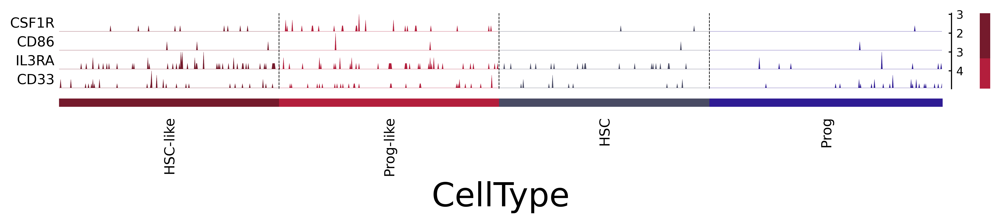

In [728]:
ix=np.isin(adata_sub.obs['CellType'],['HSC-like','Prog-like','HSC','Prog']) 
adata_sub_fig=adata_sub[ix].copy()

#subsample 300 malignant HSCs for visualization purposes
x_samp=adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['HSC-like'])]
x_samp=np.random.choice(x_samp,300,replace=False)
x_obs=list(x_samp)+list(adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['Prog-like','HSC','Prog'])])
adata_sub_fig=adata_sub_fig[x_obs].copy()

#subsample 300 malignant Progs for visualization purposes
x_samp=adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['Prog-like'])]
x_samp=np.random.choice(x_samp,300,replace=False)
x_obs=list(x_samp)+list(adata_sub_fig.obs_names[np.isin(adata_sub_fig.obs['CellType'],['HSC-like','HSC','Prog'])])
adata_sub_fig=adata_sub_fig[x_obs].copy()

adata_sub_fig.obs['CellType'].cat.reorder_categories(['HSC-like','Prog-like','HSC','Prog'], inplace=True)
adata_sub_fig.uns['CellType_colors']=['#751a2c', '#b31e3c','#494b64', '#2f1c94']

sc.pl.tracksplot(adata_sub_fig, 
                 var_names=['CSF1R','CD86','IL3RA','CD33'],
                 groupby='CellType', 
                 cmap='Reds', 
                 var_group_positions=[(0,2),(3,4)],
                 var_group_labels=['candidates','reference'],
                 standart_scale='var')